In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
pd.set_option('display.max_rows', 500)
pd.set_option('display.max_columns', 500)
import warnings
warnings.filterwarnings('ignore')

In [2]:
df = pd.read_csv('DC_Properties_Clean')

## Exploratory Data Analysis for Washington DC Residential

This data about Washington DC Residential Sales have 53317 rows and 34 columns. Before start exploratory data analysis (EDA) this data has cleaning on data pre-processing. The area in Washington DC is divided into several **Quadrant**. Each **Quadrant** is further divided into **Ward** and each **Ward** is divided into **Assessment Neighborhood**. 
<br>
<br>
*The description about data residential is*
> * Location of residential 
> * Style of residential 
> * Facility in each residential
> * Structure for each residential

## Residential Count by Quadrant & Ward

The Quadrant in Washington DC is <b>Northwest </b>, <b>Northeast </b>, <b>Southeast </b>, <b>Southwest </b> and each quadrant further divided by WARD.
<br>
* **Ward** 1 consists of (Adams Morgan, Columbia Heights, Howard University, Kalorama, etc)
* **Ward** 2 consists of (Burleith, Chinatown, Downtown, Dupont Circle, Federal Triangle, etc)
* **Ward** 3 consists of (Chevy Chase, Cleveland Park, Colony Hill, Forest Hills, etc)
* **Ward** 4 consists of (Bright Wood Park, Crestwood, Petworth, Colonial Village)
* **Ward** 5 consists of (Arboretum, Brentwood, Brookland, Carver Langston, Michigan Park, Stronghold, etc)
* **Ward** 6 consists of (Capiton Hill, Kingman Park, Navy Yard, Near Northeast, Judiciary Square, etc)
* **Ward** 7 consists of (Benning Heights, Benning Ridge, Burrville, Central Northeast, Greenway, etc)
* **Ward** 8 consists of (Anacosita, Barry Farm, Bellevue, Douglass,Shipley Terrace, etc) 

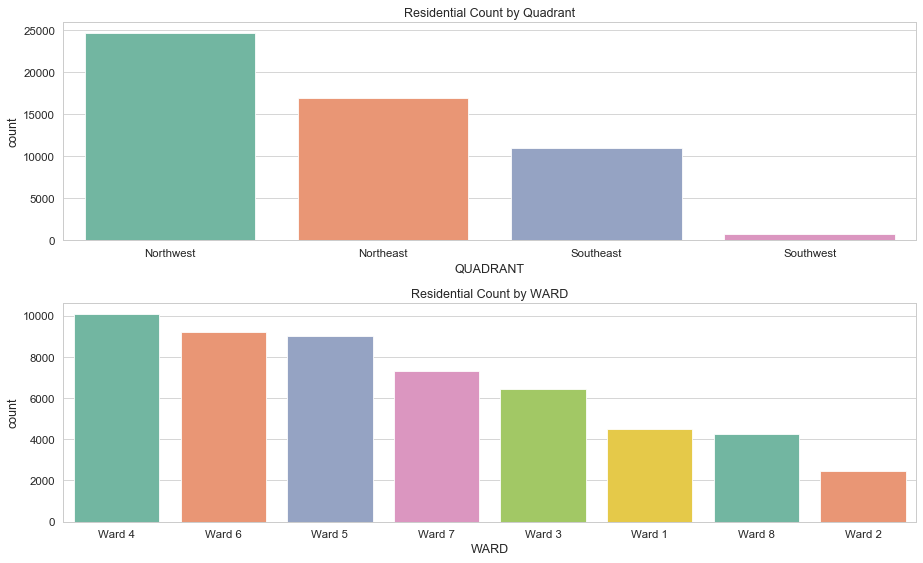

In [3]:
sns.set_style('whitegrid')
sns.set_context("paper", font_scale=1.3)
color = sns.color_palette("Set2", 6)
fig, ax = plt.subplots(2,1,figsize=(13,8))
sns.countplot(x='QUADRANT',data=df,ax=ax[0],order=df['QUADRANT'].value_counts().index,palette=color)
sns.countplot(x='WARD',data=df,ax=ax[1],order=df['WARD'].value_counts().index,palette=color)
ax[0].set_title('Residential Count by Quadrant')
ax[1].set_title('Residential Count by WARD')
plt.tight_layout()
plt.show()

> First graph explain about from the dataset most property in market at Washington DC Residential <b>Quadrant Northwest</b> (Ward 4) & the fewest porperty at Quadrant <b>Quadrant Southwest</b> (Ward 2).

## Residential Count by Neighborhood & Sub Address

Below Quadrant and Ward, Washington DC divided by <b>Neighborhood</b> and the neighborhood divided by <b>Sub Address</b>. Recorded in this dataset there is <b>55 Neighborhood</b> and <b>1186 Sub Address</b>.

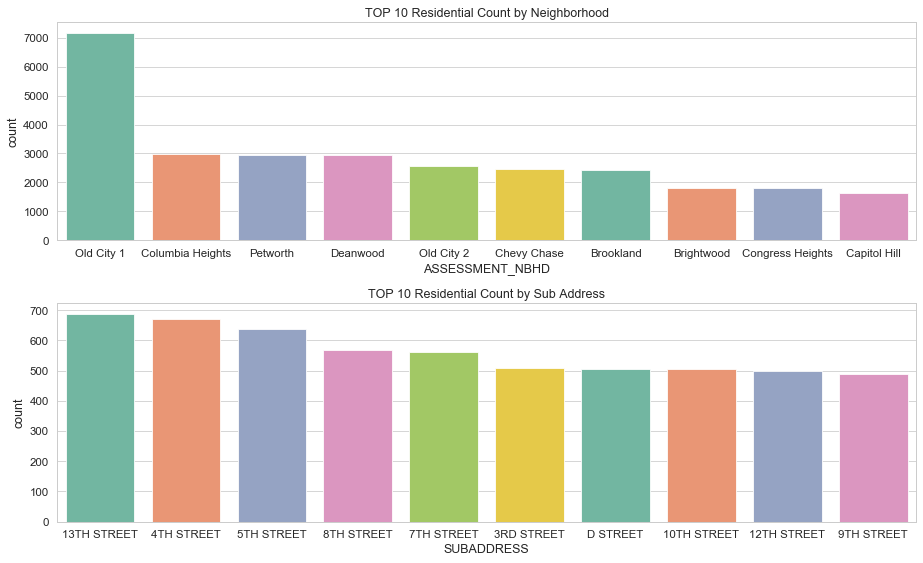

In [4]:
fig, ax = plt.subplots(2,1,figsize=(13,8))
sns.countplot(x='ASSESSMENT_NBHD',data=df,ax=ax[0],order=df['ASSESSMENT_NBHD'].value_counts().head(10).index,palette=color)
sns.countplot(x='SUBADDRESS',data=df,ax=ax[1],order=df['SUBADDRESS'].value_counts().head(10).index,palette=color)
ax[0].set_title('TOP 10 Residential Count by Neighborhood')
ax[1].set_title('TOP 10 Residential Count by Sub Address')
plt.tight_layout()
plt.show()

In [5]:
top_ten_neigh = df.ASSESSMENT_NBHD.value_counts()[:10]
WARD = []
QUADRANT = []
for item in top_ten_neigh.index:
    ward = df[df.ASSESSMENT_NBHD ==item]['WARD'].values[0]
    quadrant = df[df.ASSESSMENT_NBHD ==item]['QUADRANT'].values[0]
    WARD.append(ward)
    QUADRANT.append(quadrant)
newdict={
    'Neighborhood': top_ten_neigh.index,
    'Ward': WARD,
    'Quadrant': QUADRANT
}

Top10Neigh = pd.DataFrame(newdict)
Top10Neigh

,Neighborhood,Ward,Quadrant
0,Old City 1,Ward 6,Southwest
1,Columbia Heights,Ward 1,Northwest
2,Petworth,Ward 4,Northwest
3,Deanwood,Ward 7,Northeast
4,Old City 2,Ward 2,Northwest
5,Chevy Chase,Ward 3,Northwest
6,Brookland,Ward 5,Northeast
7,Brightwood,Ward 4,Northwest
8,Congress Heights,Ward 8,Southeast
9,Capitol Hill,Ward 6,Northeast


> First graph is property by Neighborhood, and the result is most property at <b>Old City 1</b> at <b>Ward 6</b> in <b>Southwest</b>

In [6]:
top_ten_sub = df.SUBADDRESS.value_counts()[:10]
NEIGH = []
WARD = []
QUADRANT = []
for item in top_ten_neigh.index:
    neigh = df[df.ASSESSMENT_NBHD ==item]['ASSESSMENT_NBHD'].values[0]
    ward = df[df.ASSESSMENT_NBHD ==item]['WARD'].values[0]
    quadrant = df[df.ASSESSMENT_NBHD ==item]['QUADRANT'].values[0]
    NEIGH.append(neigh)
    WARD.append(ward)
    QUADRANT.append(quadrant)
newdict={
    'Sub Address': top_ten_sub.index,
    'Neighborhood':NEIGH,
    'Ward': WARD,
    'Quadrant': QUADRANT
}

Top10Sub = pd.DataFrame(newdict)
Top10Sub

,Sub Address,Neighborhood,Ward,Quadrant
0,13TH STREET,Old City 1,Ward 6,Southwest
1,4TH STREET,Columbia Heights,Ward 1,Northwest
2,5TH STREET,Petworth,Ward 4,Northwest
3,8TH STREET,Deanwood,Ward 7,Northeast
4,7TH STREET,Old City 2,Ward 2,Northwest
5,3RD STREET,Chevy Chase,Ward 3,Northwest
6,D STREET,Brookland,Ward 5,Northeast
7,10TH STREET,Brightwood,Ward 4,Northwest
8,12TH STREET,Congress Heights,Ward 8,Southeast
9,9TH STREET,Capitol Hill,Ward 6,Northeast


> First graph is counted most property by Sub Address, and the result is most property at <b>13th Street </b> in <b>Old City 1</b> <b>Ward 6</b> in <b>Southwest</b>

In [7]:
df.head()

,Unnamed: 0,BATHRM,HF_BATHRM,HEAT,AC,NUM_UNITS,ROOMS,BEDRM,AYB,YR_RMDL,EYB,PRICE,QUALIFIED,GBA,BLDG_NUM,STYLE,STRUCT,GRADE,CNDTN,EXTWALL,ROOF,INTWALL,KITCHENS,FIREPLACES,LANDAREA,SOURCE,SUBADDRESS,ZIPCODE,LATITUDE,LONGITUDE,ASSESSMENT_NBHD,WARD,SQUARE,QUADRANT
0,0,4,0,Warm Cool,Y,2,8,4,1910,1988,1972,1095000.0,Q,2522.0,1,3 Story,Row Inside,Very Good,Good,Common Brick,Metal- Sms,Hardwood,2,5,1680,Residential,SWANN STREET,20009,38.914680,-77.040832,Old City 2,Ward 2,152,Northwest
1,1,3,1,Hot Water Rad,Y,2,8,4,1906,2011,1972,1050000.0,Q,2401.0,1,3 Story,Row Inside,Very Good,Average,Common Brick,Metal- Sms,Hardwood,2,1,1627,Residential,1/2 T STREET,20009,38.915408,-77.040129,Old City 2,Ward 2,152,Northwest
2,2,3,1,Warm Cool,Y,2,7,3,1908,2008,1967,1430000.0,Q,1488.0,1,2 Story,Row Inside,Above Average,Very Good,Common Brick,Built Up,Hardwood,2,1,1424,Residential,SWANN STREET,20009,38.915017,-77.039903,Old City 2,Ward 2,152,Northwest
3,3,3,1,Warm Cool,Y,2,5,3,1917,2000,1967,1325000.0,Q,2692.0,1,2 Story,Row Inside,Above Average,Very Good,Stucco,Metal- Sms,Hardwood,2,1,1815,Residential,SWANN STREET,20009,38.915038,-77.039716,Old City 2,Ward 2,152,Northwest
4,4,3,1,Warm Cool,Y,1,8,3,1908,2006,1967,1240000.0,Q,1662.0,1,2 Story,Row Inside,Above Average,Very Good,Common Brick,Metal- Sms,Hardwood,1,0,1424,Residential,SWANN STREET,20009,38.915018,-77.039844,Old City 2,Ward 2,152,Northwest


## Distribution Style by Longitude & Latitude

Residential style sale in Washington DC are divided into 17 Categories. The 17 style of residential include.
* <b>1 story</b> house consisting of a ground storey only
* <b>1.5 story</b> house that has the master bedroom suite on the main floor and all other bedrooms on the second floor.
* <b>2 story</b> house have the master bedroom suite and additional bedrooms located on the second level of the home.
* <b>2.5 story</b>house would mean its a house that is 2 storey with an loft.
* <b>3 story</b> house would mean its a house that is 3 storey, usually have a ground floor used for the living space and kitchen.
* <b>3.5 story</b>house would mean its a house that is 3 storey with an loft.
* <b>4 story</b> house would mean its a house that is 4 storey.
* <b>4.5 story</b> house would mean its a house that is 4 storey with an loft.
* <b> Split Level </b> A split-level home (also called a tri-level home) is a style of house in which the floor levels are staggered. There are typically two short sets of stairs, one running upward to a bedroom level, and one going downward toward a basement area.
* <b> Split Foyer and Bi-Level</b> same as split level but in another ward different called.
* <b> Vacant </b> Vacant Property means residential, commercial, industrial, or mixed use real property that has not been lawfully occupied and maintained, actively marketed for rental, or under active construction for a continuous period of forty-five (45) days or more
* *Unfin & Fin meaning about the loft not yet completed*

There is visualiation residential style in Washington DC by mapping style based on longitude and latitude :

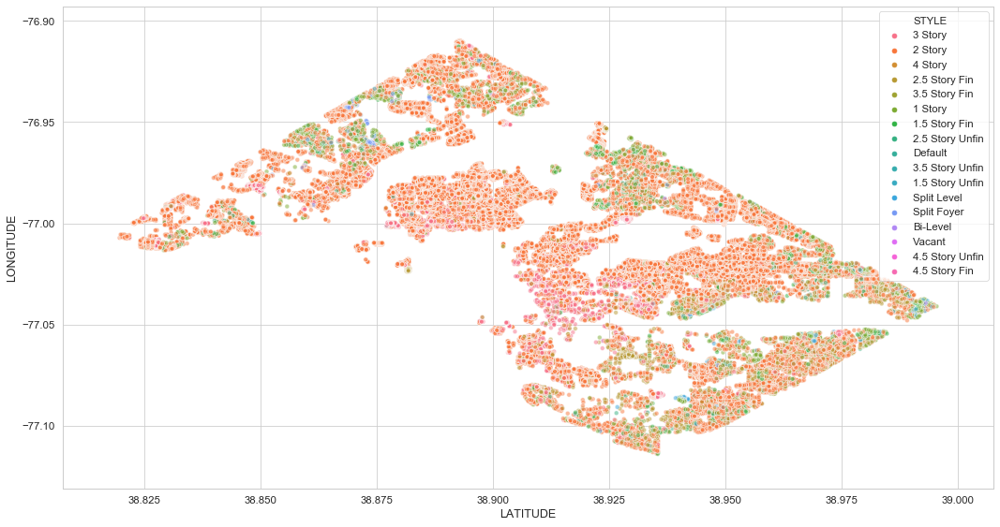

In [8]:
fig = plt.figure(figsize=(15,8))
sns.scatterplot(data=df, x= 'LATITUDE', y = 'LONGITUDE', hue = 'STYLE' , alpha = 0.5)
plt.tight_layout()

In [9]:
df.groupby('STYLE').mean()[['GBA']].sort_values(by='GBA',ascending=False)

,GBA
STYLE,
4 Story,3119.974138
3.5 Story Fin,2551.561404
Vacant,2392.000000
2.5 Story Fin,2359.981746
3 Story,2301.964343
3.5 Story Unfin,1926.666667
2.5 Story Unfin,1913.606648
Split Level,1863.813333
4.5 Story Unfin,1808.000000


From this table the conclusion is about the 4 story have a highest land area in style, because this style have a 4 stories and many rooms facility.

In [10]:
df.groupby('STYLE').mean()[['PRICE']].sort_values(by='PRICE',ascending=False)

,PRICE
STYLE,
Vacant,960000.000000
4 Story,844293.318966
2.5 Story Fin,754767.775307
3.5 Story Fin,734286.684211
Bi-Level,710937.500000
3 Story,696085.562917
Split Level,588804.893333
2.5 Story Unfin,559529.224377
3.5 Story Unfin,556740.000000


From this table the conclusion is about the vacant residential have a highest average price in style.

## Distribution Price in Washington DC Residential
Visualization of house property prices in Washington DC when classified by style of residential. Can be seen if 2 story style residential is most dominated than other.
* 2 Story :          42097 
* 3 Story :          4347
* 2.5 Story Fin :    3013
* 1 Story :          1873
* 1.5 Story Fin :     1094

In [11]:
import plotly.graph_objects as go
import folium
import matplotlib
from folium.plugins import HeatMap

In [12]:
fig = go.Figure(go.Densitymapbox(lat=df.LATITUDE, lon=df.LONGITUDE, z=df.PRICE, radius=5, opacity=0.6))
fig.update_layout(mapbox_style="stamen-terrain", mapbox_center_lon=180,)
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})

fig.add_trace(go.Scattermapbox(
        lat=[38.889484],
        lon=[-77.035278],
        mode='markers',
        marker=go.scattermapbox.Marker(
            size=17,
            color='rgb(255, 0, 0)',
            opacity=0.7
        ),
        text=['Washington Monument']
    ))
go.Densitymapbox()

fig.show()

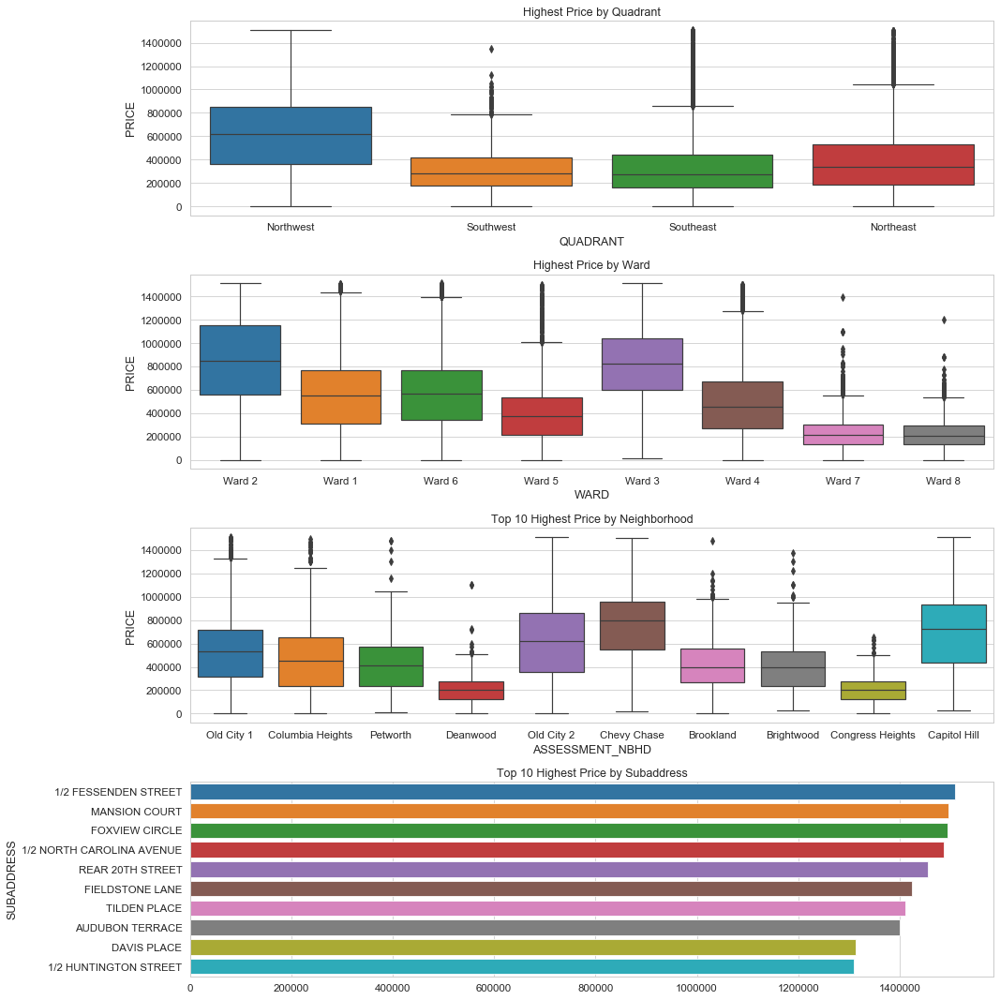

In [13]:
sub_address_price = round(df.groupby(['SUBADDRESS']).mean()['PRICE']).sort_values(ascending=False)
fig, ax = plt.subplots(4,1,figsize=(15,15))
sns.boxplot(data=df, x='QUADRANT', y='PRICE',ax=ax[0])
sns.boxplot(data=df, x='WARD', y='PRICE',ax=ax[1])
sns.boxplot(data=df, x='ASSESSMENT_NBHD', y='PRICE',ax=ax[2],order=df.ASSESSMENT_NBHD.value_counts().head(10).index)
sns.barplot(x=sub_address_price[:10].values, y=sub_address_price[:10].index,ax=ax[3])
ax[0].set_title('Highest Price by Quadrant')
ax[1].set_title('Highest Price by Ward')
ax[2].set_title('Top 10 Highest Price by Neighborhood')
ax[3].set_title('Top 10 Highest Price by Subaddress')
plt.tight_layout()
plt.show()

* Northwest have a range highest range price in Quadrant at Washington DC 
* Ward 2 and Ward 3 have a range highest range price in Ward at Washington DC
* Old City 1, Old City 2 and Chevy Chase have a highest range price in Top 10 Neighborhood at Washington DC 
* Range price in each Top 10 Subaddress almost same for 4 subaddress.

### Distribution Price by Residential Style, Grade and Condition
After grouping price with location, this visualization about distribution price in style, grade and condition. How much impact the style, grade and condition to price of residential in Washington.

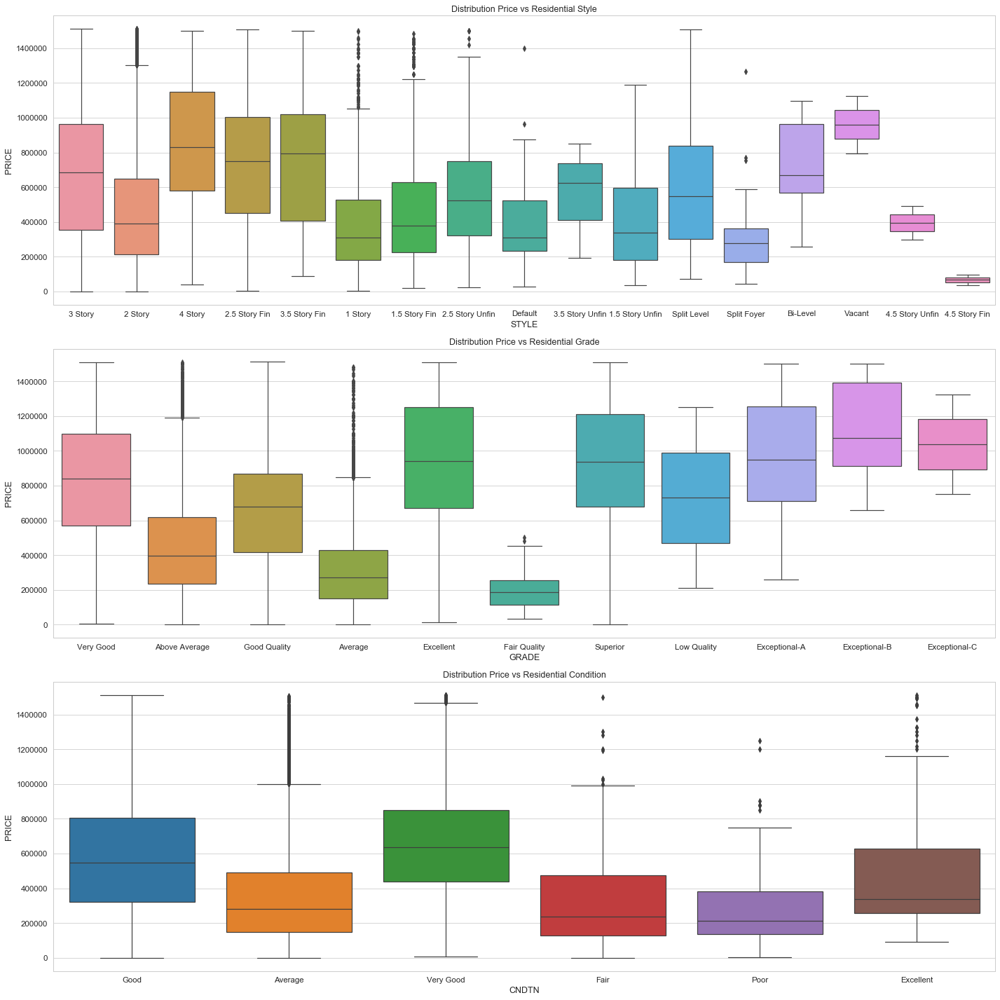

In [14]:
fig, ax = plt.subplots(3,1,figsize=(20,20))
sns.boxplot(data=df, x='STYLE', y='PRICE',ax=ax[0],)
sns.boxplot(data=df, x='GRADE', y='PRICE',ax=ax[1])
sns.boxplot(data=df, x='CNDTN', y='PRICE',ax=ax[2])
ax[0].set_title('Distribution Price vs Residential Style')
ax[1].set_title('Distribution Price vs Residential Grade')
ax[2].set_title('Distribution Price vs Residential Condition')
plt.tight_layout()

In [15]:
df.groupby('GRADE').mean()[['PRICE']].sort_values(by='PRICE',ascending=False)

,PRICE
GRADE,
Exceptional-B,1.125118e+06
Exceptional-C,1.037500e+06
Exceptional-A,9.675561e+05
Excellent,9.365315e+05
Superior,9.319167e+05
Very Good,8.346383e+05
Low Quality,7.300000e+05
Good Quality,6.639644e+05
Above Average,4.414140e+05


In [16]:
df.groupby('CNDTN').mean()[['PRICE']].sort_values(by='PRICE',ascending=False)

,PRICE
CNDTN,
Very Good,683442.055366
Good,589399.059215
Excellent,453816.072500
Average,359459.597414
Fair,315172.087234
Poor,311642.774648


* For style residential in Washington dominated by 2 story and 3 story have a highest range of price.
* For grade residential in Washington with highest average price is Exceptional-B 
* For grade residential in Washington with highest average price is Very Good

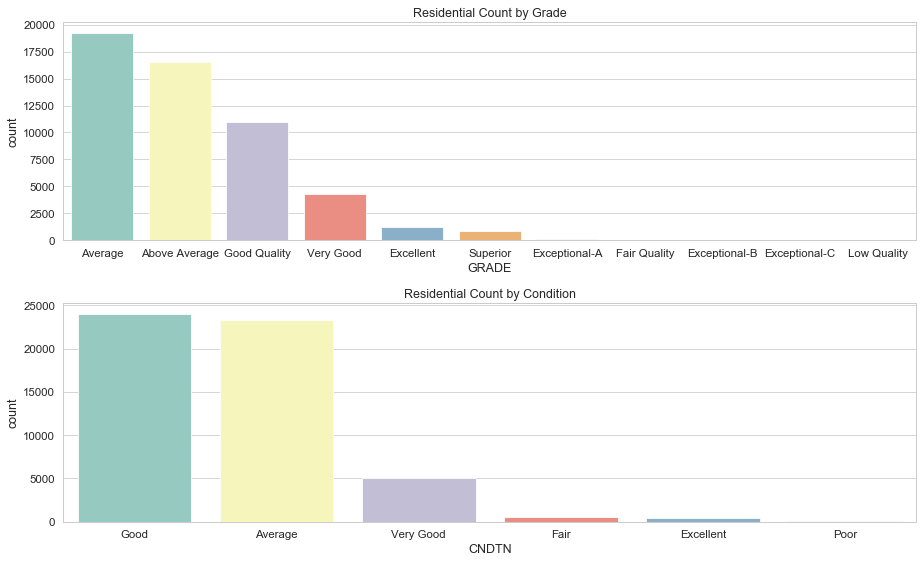

In [17]:
color = sns.color_palette("Set3",6)
fig, ax = plt.subplots(2,1,figsize=(13,8))
sns.countplot(x='GRADE',data=df,ax=ax[0],order=df['GRADE'].value_counts().index,palette=color)
sns.countplot(x='CNDTN',data=df,ax=ax[1],order=df['CNDTN'].value_counts().index,palette=color)
ax[0].set_title('Residential Count by Grade')
ax[1].set_title('Residential Count by Condition')
plt.tight_layout()
plt.show()

* First graph explain about most residential have a grade in average, following above average and Good quality in best 3.
* First graph explain about most residential have a condition Good & average, dominated all condition in residential.

## House Feature related to Price 

Price visualization when compared with features available in each residential. The features that will be used as a comparison are the features that already exist in the dataset used, while the features include:
* Number of Bathrooms
* Land Area
* Number of Units
* Number of Rooms
* Number of Bedroom
* Year Remodel
* Gross Building Area
* Building Number
* Number of Kitcens
* Number of Fireplaces

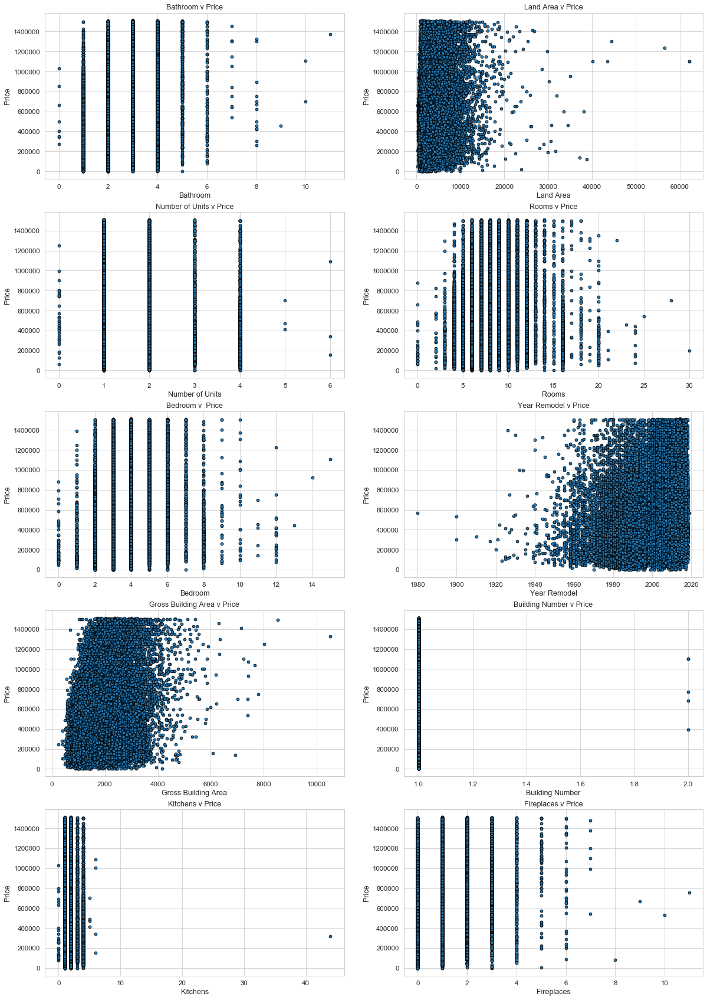

In [18]:
f, axes = plt.subplots(5,2, figsize = (20,30))

# Plot [0,0]
axes[0,0].scatter(x = 'BATHRM', y = 'PRICE', data = df, edgecolor = 'black')
axes[0,0].set_xlabel('Bathroom')
axes[0,0].set_ylabel('Price')
axes[0,0].set_title('Bathroom v Price')

# Plot [0,1]
axes[0,1].scatter(x = 'LANDAREA', y = 'PRICE', data = df, edgecolor = 'black')
axes[0,1].set_xlabel('Land Area')
axes[0,1].set_ylabel('Price')
axes[0,1].set_title('Land Area v Price')

# Plot [1,0]
axes[1,0].scatter(x = 'NUM_UNITS', y = 'PRICE', data = df, edgecolor = 'black')
axes[1,0].set_xlabel('Number of Units')
axes[1,0].set_ylabel('Price')
axes[1,0].set_title('Number of Units v Price')

# Plot [1,1]
axes[1,1].scatter(x = 'ROOMS', y = 'PRICE', data = df, edgecolor = 'black')
axes[1,1].set_xlabel('Rooms')
axes[1,1].set_ylabel('Price')
axes[1,1].set_title('Rooms v Price')

# Plot [2,0]
axes[2,0].scatter(x = 'BEDRM', y = 'PRICE', data = df, edgecolor = 'black')
axes[2,0].set_xlabel('Bedroom')
axes[2,0].set_ylabel('Price')
axes[2,0].set_title('Bedroom v  Price')

# Plot [2,1]
axes[2,1].scatter(x = 'YR_RMDL', y = 'PRICE', data = df, edgecolor = 'black')
axes[2,1].set_xlabel('Year Remodel')
axes[2,1].set_ylabel('Price')
axes[2,1].set_title('Year Remodel v Price')

# Plot [3,0]
axes[3,0].scatter(x = 'GBA', y = 'PRICE', data = df, edgecolor = 'black')
axes[3,0].set_xlabel('Gross Building Area')
axes[3,0].set_ylabel('Price')
axes[3,0].set_title('Gross Building Area v Price')

# Plot [3,1]
axes[3,1].scatter(x = 'BLDG_NUM', y = 'PRICE', data = df, edgecolor = 'black')
axes[3,1].set_xlabel('Building Number')
axes[3,1].set_ylabel('Price')
axes[3,1].set_title('Building Number v Price')

# Plot [4,0]
axes[4,0].scatter(x = 'KITCHENS', y = 'PRICE', data = df, edgecolor = 'black')
axes[4,0].set_xlabel('Kitchens')
axes[4,0].set_ylabel('Price')
axes[4,0].set_title('Kitchens v Price')

# Plot [4,1]
axes[4,1].scatter(x = 'FIREPLACES', y = 'PRICE', data = df, edgecolor = 'black')
axes[4,1].set_xlabel('Fireplaces')
axes[4,1].set_ylabel('Price')
axes[4,1].set_title('Fireplaces v Price')

plt.show()

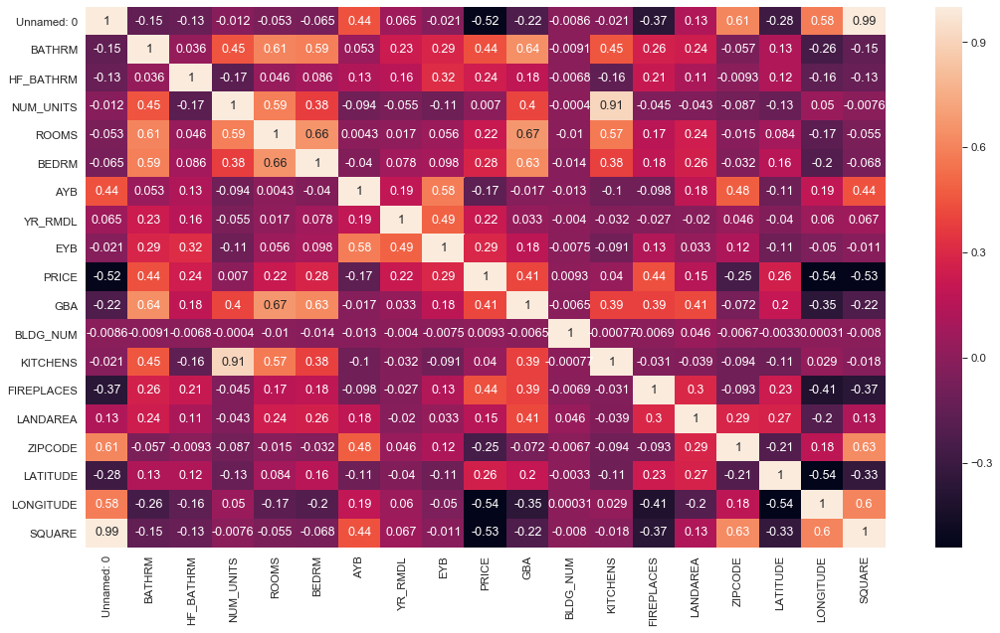

In [22]:
plt.figure(figsize=(18,10))
sns.heatmap(df.corr(),annot=True)